In [11]:
import xarray as xr
# import rioxarray
import numpy as np
# from rasterio.enums import Resampling
import matplotlib.pyplot as plt
# import cartopy.crs as ccrs
# import cartopy.feature as cfeature  # Add this import
# from matplotlib.colors import BoundaryNorm
# from cartopy.util import add_cyclic_point
# from datetime import datetime
# from matplotlib.colors import LogNorm
# import matplotlib.colors as colors
# from matplotlib.colors import SymLogNorm
# from cartopy.feature import NaturalEarthFeature
# import matplotlib.ticker as ticker

# Define **plotting** functions

In [12]:
def plot_world_person_days(mmax, age, threshold, reference, world = '2C'):
    
    tick_locations = [10**i for i in range(0, 9)]  # This will create [1, 10, 100, 1000, ..., 100000000]
    
    # Setting geography boundaries 
    lat_min = -90
    lat_max = 90
    lon_min = -180
    lon_max = 180

    latitudes = mmax.coords['latitude'].sel(latitude=slice(lat_max, lat_min)).values 
    longitudes = mmax.coords['longitude'].sel(longitude=slice(lon_min, lon_max)).values
    
    # Create 2D coordinate arrays
    longitudes, latitudes = np.meshgrid(longitudes, latitudes)
    
    # Ensure mmax has the correct shape
    if mmax.shape != latitudes.shape:
        mmax = mmax.T
    
    ssp = str(245)

    if world == '2C':
    
        title_colorbar = 'Average annual heat exposure (in person-days); ' + r'$M_{max}$' + \
                         ' < ' + threshold + ' (' + reference + '); ' + age + ' at 2' + r'$\degree$' + \
                         'C'
        
    elif world == 'baseline':
        
        title_colorbar = 'Average annual heat exposure (person-days); ' + r'$M_{max}$' + \
                         ' < ' + threshold + ' (' + reference + '); ' + age + '; ERA5 baseline'
        
    fig = plt.figure(figsize = (8, 8))
    ax = fig.add_subplot(1, 1, 1, projection = ccrs.Robinson())
    ax.stock_img()
    ax.coastlines(lw = 0.4)

    min_value = 1  # To avoid taking log(0)
    max_value = 189556572

    levels = np.logspace(np.log10(min_value), np.log10(max_value), num = 10)
    norm = colors.LogNorm(vmin = min_value, vmax = max_value)

    cmap = plt.get_cmap('plasma')

    mmax_masked = np.ma.masked_where(mmax == 0, mmax)
    filled_c = ax.pcolormesh(longitudes, latitudes, mmax_masked, 
                             transform=ccrs.PlateCarree(), 
                             cmap='plasma', norm=norm)
    
    clb = plt.colorbar(filled_c, orientation='horizontal', extend='both', pad=0.04)
    clb.set_ticks(tick_locations)
    clb.set_ticklabels(['$10^{' + str(i) + '}$' for i in range(0, 9)])
    clb.ax.tick_params(labelsize=8)  # Adjust label size if needed
    clb.set_label(title_colorbar, fontsize=10, labelpad=-59)

    gl = ax.gridlines(draw_labels = False, linewidth = 0.5)
    gl.top_labels = False; gl.left_labels = False

    fig.tight_layout()

    # Adjust the subplot parameters
    # plt.subplots_adjust(left = 0.1, right = 0.9, top = 2, bottom = 0.1)

    plt.savefig('Mmax_2c_'+ age + '.png', dpi = 600, transparent = False, 
                bbox_inches = 'tight', pad_inches = 0.2)   
    plt.show(); plt.close()

In [13]:
def plot_india_person_days(mmax, age, threshold, reference, world = '2C'):
    
    tick_locations = [10**i for i in range(0, 9)]  # This will create [1, 10, 100, 1000, ..., 100000000]
    
    # Setting geography boundaries 
    lat_min = -90
    lat_max = 90
    lon_min = -180
    lon_max = 180

    latitudes = mmax.coords['latitude'].sel(latitude=slice(lat_max, lat_min)).values 
    longitudes = mmax.coords['longitude'].sel(longitude=slice(lon_min, lon_max)).values
    
    # Create 2D coordinate arrays
    longitudes, latitudes = np.meshgrid(longitudes, latitudes)
    
    # Ensure mmax has the correct shape
    if mmax.shape != latitudes.shape:
        mmax = mmax.T
    
    if world == '2C':
    
        title_colorbar = 'Average annual heat exposure (in person-days); ' + r'$M_{max}$' + \
                         ' < ' + threshold + ' (' + reference + '); ' + age + ' at 2' + r'$\degree$' + \
                         'C'
        
    elif world == 'baseline':
        
        title_colorbar = 'Average annual heat exposure (person-days); ' + r'$M_{max}$' + \
                         ' < ' + threshold + ' (' + reference + '); ' + age + '; ERA5 baseline'
        
    fig = plt.figure(figsize = (10, 8))

    # Use AzimuthalEquidistant projection centered on India
    projection = ccrs.AzimuthalEquidistant(central_longitude = 78, central_latitude = 22)
    ax = fig.add_subplot(1, 1, 1, projection = projection)
    ax.stock_img()
    ax.coastlines(resolution = '50m')
    
    # Set map boundaries for India
    ax.set_extent([68, 98, 6, 38], crs = ccrs.PlateCarree())
    
    # Add map features
    ax.add_feature(NaturalEarthFeature('cultural', 'admin_1_states_provinces_lines', '50m', edgecolor = 'gray', 
                                       facecolor = 'none'))
    ax.add_feature(NaturalEarthFeature('cultural', 'admin_0_countries', '50m', edgecolor = 'black', 
                                       facecolor = 'none'))
    
    min_value = 1  # To avoid taking log(0)
    max_value = 189556572
    
    levels = np.logspace(np.log10(min_value), np.log10(max_value), num = 10)
    norm = colors.LogNorm(vmin = min_value, vmax = max_value)
    
    cmap = plt.get_cmap('plasma')
    
    mmax_masked = np.ma.masked_where(mmax == 0, mmax)
    filled_c = ax.pcolormesh(longitudes, latitudes, mmax_masked, 
                             transform=ccrs.PlateCarree(), 
                             cmap='plasma', norm=norm)

    clb = plt.colorbar(filled_c, orientation='horizontal', extend='both', pad=0.04)
    clb.set_ticks(tick_locations)
    clb.set_ticklabels(['$10^{' + str(i) + '}$' for i in range(0, 9)])
    clb.ax.tick_params(labelsize=8)  # Adjust label size if needed
    clb.set_label(title_colorbar, fontsize=10, labelpad=-63)


    gl = ax.gridlines(draw_labels = True, linewidth = 0.5, color = 'gray', alpha = 0.5, linestyle = '--')
    gl.top_labels = True
    gl.right_labels = False
    gl.bottom_labels = False
    gl.xlabel_style = {'size': 8}
    gl.ylabel_style = {'size': 8}

    fig.tight_layout()

    # plt.savefig('Mmax_2c_' + age + '_India.png', dpi = 600, transparent = False, 
    #             bbox_inches = 'tight', pad_inches = 0.2)   

    plt.show()
    plt.close()

In [14]:
def plot_world_person_days_diff(mmax, age, threshold, reference):
    
    # Setting geography boundaries 
    lat_min, lat_max = -90, 90
    lon_min, lon_max = -180, 180

    latitudes = mmax.coords['latitude'].sel(latitude=slice(lat_max, lat_min)).values 
    longitudes = mmax.coords['longitude'].sel(longitude=slice(lon_min, lon_max)).values
    
    # Create 2D coordinate arrays
    longitudes, latitudes = np.meshgrid(longitudes, latitudes)
    
    # Ensure mmax has the correct shape
    if mmax.shape != latitudes.shape:
        mmax = mmax.T
        
    title_colorbar = 'Average annual heat exposure (in person-days); ' + r'$M_{max}$' + \
                     ' < ' + threshold + ' (' + reference + '); ' + age + ' difference [2' + r'$\degree$' + \
                     'C - baseline]'

    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.Robinson())
    ax.stock_img()
    ax.coastlines(lw=0.4)

    # Determine the maximum absolute value for symmetrical scaling
    max_abs_value = 1000000000
    
    # Create a symmetrical logarithmic normalization
    norm = colors.SymLogNorm(linthresh=1, linscale=1, vmin=-max_abs_value, vmax=max_abs_value)

    # Use a diverging colormap centered at zero
    cmap = plt.get_cmap('RdBu_r')

    mmax_masked = np.ma.masked_where(mmax == 0, mmax)
    filled_c = ax.pcolormesh(longitudes, latitudes, mmax_masked, 
                             transform=ccrs.PlateCarree(), 
                             cmap=cmap, norm=norm)
    
    # Create custom tick locations for the colorbar
    tick_locations = [-max_abs_value, -10000000, -100000, -100, 0, 100, 100000, 10000000, max_abs_value]
    
    clb = plt.colorbar(filled_c, orientation='horizontal', extend='both', pad=0.04)
    clb.set_ticks(tick_locations)
    clb.set_ticklabels(['$-10^{9}$', 
                        '$-10^{7}$',
                        '$-10^{5}$',
                        '$-10^{2}$',
                        '0',
                        '$10^{2}$',
                        '$10^{5}$',
                        '$10^{7}$',
                        '$10^{9}$'])
    clb.ax.tick_params(labelsize=8)  # Adjust label size if needed
    clb.set_label(title_colorbar, fontsize=10, labelpad=10)

    gl = ax.gridlines(draw_labels=False, linewidth=0.5)
    gl.top_labels = False
    gl.left_labels = False

    fig.tight_layout()

    # plt.savefig(f'Mmax_2c_{age}.png', dpi=600, transparent=False, 
    #             bbox_inches='tight', pad_inches=0.2)   
    plt.show()
    plt.close()

In [15]:
def plot_india_person_days_diff(mmax, age, threshold, reference):
    
    # Determine the maximum absolute value for symmetrical scaling
    max_abs_value = 1000000000
    
    # Create custom tick locations for the colorbar
    tick_locations = [-max_abs_value, -10000000, -100000, -100, 0, 100, 100000, 10000000, max_abs_value]
    
    # Setting geography boundaries 
    lat_min, lat_max = -90, 90
    lon_min, lon_max = -180, 180

    latitudes = mmax.coords['latitude'].sel(latitude=slice(lat_max, lat_min)).values 
    longitudes = mmax.coords['longitude'].sel(longitude=slice(lon_min, lon_max)).values
    
    # Create 2D coordinate arrays
    longitudes, latitudes = np.meshgrid(longitudes, latitudes)
    
    # Ensure mmax has the correct shape
    if mmax.shape != latitudes.shape:
        mmax = mmax.T
        
    title_colorbar = 'Average annual heat exposure (in person-days); ' + r'$M_{max}$' + \
                     ' < ' + threshold + ' (' + reference + '); ' + age + ' difference [2' + r'$\degree$' + \
                     'C - baseline]'

    fig = plt.figure(figsize = (10, 8))
    
    # Use AzimuthalEquidistant projection centered on India
    projection = ccrs.AzimuthalEquidistant(central_longitude = 78, central_latitude = 22)
    ax = fig.add_subplot(1, 1, 1, projection = projection)
    ax.stock_img()
    ax.coastlines(resolution = '50m')
    
    # Set map boundaries for India
    ax.set_extent([68, 98, 6, 38], crs = ccrs.PlateCarree())
    
    # Add map features
    ax.add_feature(NaturalEarthFeature('cultural', 'admin_1_states_provinces_lines', '50m', edgecolor = 'gray', 
                                       facecolor = 'none'))
    ax.add_feature(NaturalEarthFeature('cultural', 'admin_0_countries', '50m', edgecolor = 'black', 
                                       facecolor = 'none'))
    
    # Create a symmetrical logarithmic normalization
    norm = colors.SymLogNorm(linthresh=1, linscale=1, vmin=-max_abs_value, vmax=max_abs_value)

    # Use a diverging colormap centered at zero
    cmap = plt.get_cmap('RdBu_r')

    mmax_masked = np.ma.masked_where(mmax == 0, mmax)
    filled_c = ax.pcolormesh(longitudes, latitudes, mmax_masked, 
                             transform=ccrs.PlateCarree(), 
                             cmap=cmap, norm=norm)
    
    clb = plt.colorbar(filled_c, orientation='horizontal', extend='both', pad=0.04)
    clb.set_ticks(tick_locations)
    clb.set_ticklabels(['$-10^{9}$', 
                        '$-10^{7}$',
                        '$-10^{5}$',
                        '$-10^{2}$',
                        '0',
                        '$10^{2}$',
                        '$10^{5}$',
                        '$10^{7}$',
                        '$10^{9}$'])
    clb.ax.tick_params(labelsize=8)  # Adjust label size if needed
    clb.set_label(title_colorbar, fontsize=10, labelpad=10)

    gl = ax.gridlines(draw_labels = True, linewidth = 0.5, color = 'gray', alpha = 0.5, linestyle = '--')
    gl.top_labels = True
    gl.right_labels = False
    gl.bottom_labels = False
    gl.xlabel_style = {'size': 8}
    gl.ylabel_style = {'size': 8}

    fig.tight_layout()

    # plt.savefig(f'Mmax_2c_{age}.png', dpi=600, transparent=False, 
    #             bbox_inches='tight', pad_inches=0.2)   
    plt.show()
    plt.close()

# Load in the data

In [16]:
directory = 'C:/Users/haley/OneDrive/Graduate/Research/pyhhb/'

## WorldPop total population counts

In [17]:
data = xr.open_dataset(directory + "pop_fig/owi_avg.nc")

ValueError: found the following matches with the input file in xarray's IO backends: ['netcdf4', 'h5netcdf']. But their dependencies may not be installed, see:
http://xarray.pydata.org/en/stable/user-guide/io.html 
http://xarray.pydata.org/en/stable/getting-started-guide/installing.html

In [18]:
worldpop_2000 = xr.open_dataset(directory + 'WorldPop/ppp_2000_0point25deg_Aggregated.nc')
worldpop_2020 = xr.open_dataset(directory + 'WorldPop/ppp_2020_0point25deg_Aggregated_new.nc')

ValueError: found the following matches with the input file in xarray's IO backends: ['netcdf4', 'h5netcdf']. But their dependencies may not be installed, see:
http://xarray.pydata.org/en/stable/user-guide/io.html 
http://xarray.pydata.org/en/stable/getting-started-guide/installing.html

## WorldPop ratios

In [45]:
# FILL THIS IN

## WIC-derived ratios

In [9]:
# Load in IIASA-derived ratios

ratio_children_2020 = xr.open_dataset(directory + 'wic_projections/Feb_17_update_data/ratio_children_2020_grid.nc')
ratio_children_2050 = xr.open_dataset(directory + 'wic_projections/Feb_17_update_data/ratio_children_2050_grid.nc')

ratio_young_2020 = xr.open_dataset(directory + 'wic_projections/Feb_17_update_data/ratio_young_2020_grid.nc')
ratio_young_2050 = xr.open_dataset(directory + 'wic_projections/Feb_17_update_data/ratio_young_2050_grid.nc')

ratio_old_2020 = xr.open_dataset(directory + 'wic_projections/Feb_17_update_data/ratio_old_2020_grid.nc')
ratio_old_2050 = xr.open_dataset(directory + 'wic_projections/Feb_17_update_data/ratio_old_2050_grid.nc')

## Wang et al (2022) population projections

In [8]:
# Load in regridded Wang et al (2022) population projections

wang_total_2020 = xr.open_dataset(directory + "wang_et_al_2022/SSP2/SPP2/SSP2_2020_regridded.nc")
wang_total_2050 = xr.open_dataset(directory + "wang_et_al_2022/SSP2/SPP2/total_pop_2050.nc")

## PyHHB output

In [11]:
# Load in PyHHB average Mmax

pyhhb_ywi_bl = xr.open_dataset(directory + 'pop_fig/ywi_lt_4point5_days_baseline.nc')
pyhhb_owi_bl = xr.open_dataset(directory + 'pop_fig/owi_lt_4point5_days_baseline.nc')

pyhhb_ywi_2050 = xr.open_dataset(directory + 'pop_fig/ywi_lt_4point5_days_2deg.nc')
pyhhb_owi_2050 = xr.open_dataset(directory + 'pop_fig/owi_lt_4point5_days_2deg.nc')

# Preprocessing

## WorldPop ratios

In [46]:
# FILL THIS IN

## WIC-derived ratios

In [ ]:
ratio_c_2020 = ratio_children_2020['2020']
ratio_c_2050 = ratio_children_2050['2050']

ratio_y_2020 = ratio_young_2020['2020']
ratio_y_2050 = ratio_young_2050['2050']

ratio_o_2020 = ratio_old_2020['2020']
ratio_o_2050 = ratio_old_2050['2050']

In [ ]:
def ratio_preprocessing(ratio):
    
    ratio = ratio.sel(lat = slice(-60.0, 90))

    new_lat = np.arange(-60, 90.25, 0.25)
    new_lon = np.arange(-180, 180.25, 0.25)

    # Make this better later
    ratio = ratio.reindex(lat=new_lat, lon=new_lon, method = 'nearest')

    ratio = ratio.rename({'lon' : 'longitude', 'lat' : 'latitude'})
    
    ratio = ratio.sel(latitude = slice(None, None, -1))
    
    return ratio

In [ ]:
ratio_c_2020p = ratio_preprocessing(ratio_c_2020)
ratio_c_2050p = ratio_preprocessing(ratio_c_2050)

ratio_y_2020p = ratio_preprocessing(ratio_y_2020)
ratio_y_2050p = ratio_preprocessing(ratio_y_2050)

ratio_o_2020p = ratio_preprocessing(ratio_o_2020)
ratio_o_2050p = ratio_preprocessing(ratio_o_2050)

In [ ]:
ratio_c_diff = ratio_c_2050p - ratio_c_2020p
ratio_y_diff = ratio_y_2050p - ratio_y_2020p
ratio_o_diff = ratio_o_2050p - ratio_o_2020p

In [ ]:
ratio_2020_tot = ratio_c_2020p + ratio_y_2020p + ratio_o_2020p
ratio_2050_tot = ratio_c_2050p + ratio_y_2050p + ratio_o_2050p

## WorldPop total population counts

In [42]:
worldpop_total_2000 = worldpop_total_2000['Band1']
worldpop_total_2020 = worldpop_total_2020['Band1']

In [43]:
def worldpop_preprocessing(worldpop):
    
    # Create new coordinate ranges
    new_lat = np.arange(90, -60.25, -0.25)
    new_lon = np.arange(-180, 180.25, 0.25)  # Changed to ensure it goes from -180 to 179.75

    # Create a new empty DataArray with the desired coordinates
    new_coords = {'lat': new_lat, 'lon': new_lon}
    worldpop_new = xr.DataArray(np.full((len(new_lat), len(new_lon)), np.nan), coords = new_coords, dims = ['lat', 'lon'])

    # Interpolate the data to the new grid
    worldpop_p = worldpop.interp(lat = worldpop_new.lat, lon = worldpop_new.lon, method = 'nearest')

    # Ensure that latitudes above 84 (the original max) are filled with NaNs
    worldpop_p = worldpop_p.where(worldpop_p.lat <= 84)
    
    worldpop_p = worldpop_p.rename({'lat': 'latitude', 'lon': 'longitude'})
    
    if year == 2000:
    
        worldpop_p = worldpop_p - (worldpop_p * ##fill this in with worldpop 2000 children ratio##)
        
    elif year == 2020:
        
        worldpop_p = worldpop_p - (worldpop_p * ##fill this in with worldpop 2000 children ratio##)   
    
    return worldpop_p

In [44]:
worldpop_total_2000p = worldpop_preprocessing(worldpop_total_2000)
worldpop_total_2020p = worldpop_preprocessing(worldpop_total_2020)

## Wang et al (2022) population projections

In [23]:
wang_total_2020_da = wang_total_2020['Band1']
wang_total_2050_da = wang_total_2050['Band1']

In [ ]:
def wang_preprocessing(wang, year):
    
    # Create new coordinate ranges
    new_lat = np.arange(90, -60.25, -0.25)
    new_lon = np.arange(-180, 180.25, 0.25)  # Changed to ensure it goes from -180 to 179.75

    # Create a new empty DataArray with the desired coordinates
    new_coords = {'lat': new_lat, 'lon': new_lon}
    wang_new = xr.DataArray(np.full((len(new_lat), len(new_lon)), np.nan), coords = new_coords, dims = ['lat', 'lon'])

    # Interpolate the data to the new grid
    wang_p = wang.interp(lat = wang_new.lat, lon = wang_new.lon, method = 'nearest')

    # Ensure that latitudes above 84 (the original max) are filled with NaNs
    wang_p = wang_p.where(wang_p.lat <= 84)
    
    wang_p = wang_p.rename({'lat': 'latitude', 'lon': 'longitude'})
    
    if year == 2020:
    
        wang_p = wang_p - (wang_p * ratio_c_2020p)
        
    elif year == 2050:
        
        wang_p = wang_p - (wang_p * ratio_c_2050p)        
    
    return wang_p

In [ ]:
wang_total_2020p = wang_preprocessing(wang_total_2020_da, 2020)
wang_total_2050p = wang_preprocessing(wang_total_2050_da, 2050)

## PyHHB output

In [25]:
pyhhb_ywi_bl_da = pyhhb_ywi_bl['__xarray_dataarray_variable__']
pyhhb_owi_bl_da = pyhhb_owi_bl['__xarray_dataarray_variable__']

pyhhb_ywi_2050_da = pyhhb_ywi_2050['__xarray_dataarray_variable__']
pyhhb_owi_2050_da = pyhhb_owi_2050['__xarray_dataarray_variable__']

In [26]:
def pyhhb_preprocessing(pyhhb, ratio):
    
    pyhhb['longitude'] = ratio['longitude']

    # Assuming your DataArray is called ywi_days_below_4point5

    # Step 1: Determine the number of longitude points
    num_lon = len(pyhhb.longitude)

    # Step 2: Roll the data along the longitude dimension
    shifted_pyhhb_data = pyhhb.roll(longitude = num_lon // 2, roll_coords = False)

    # Step 3 (Optional): Sort the longitude coordinate
    shifted_pyhhb_data = shifted_pyhhb_data.sortby('longitude')
    
    return shifted_pyhhb_data

In [27]:
pyhhb_ywi_blp = pyhhb_preprocessing(pyhhb_ywi_bl_da, ratio_y_2020p)
pyhhb_owi_blp = pyhhb_preprocessing(pyhhb_owi_bl_da, ratio_o_2020p)

pyhhb_ywi_2050p = pyhhb_preprocessing(pyhhb_ywi_2050_da, ratio_y_2050p)
pyhhb_owi_2050p = pyhhb_preprocessing(pyhhb_owi_2050_da, ratio_o_2050p)

# Testing difference between WorldPop and Wang et al 2020 conditions

In [20]:
diff = population_2020_da_extended - worldpop_2020_extended

In [27]:
worldpop_2020_extended = worldpop_2020_extended.where(worldpop_2020_extended > 1)
population_2020p = population_2020_da_extended.where(population_2020_da_extended > 1)

In [28]:
diff = population_2020p - worldpop_2020_extended

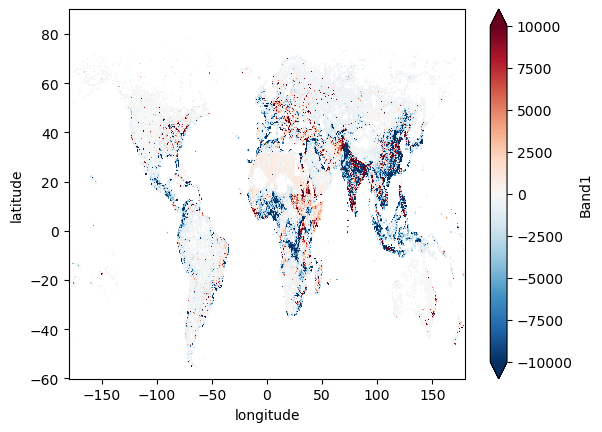

In [29]:
diff.plot(vmin = -10000, vmax = 10000, cmap = 'RdBu_r')

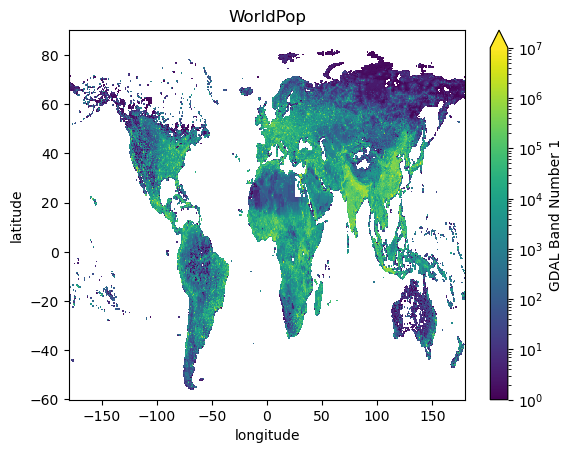

In [37]:
min_val = worldpop_2020_extended.min()

plot_min = None

if min_val <= 0:

    positive_values = worldpop_2020_extended.where(worldpop_2020_extended > 0)

    if positive_values.count() > 0: # Check if there are any positive values
        
        plot_min = positive_values.min().item() # .item() gets scalar value
        print(f"Warning: Data contains non-positive values. Using vmin={plot_min} for log scale.")

    else:

        # Handle case where there are no positive values at all
        print("Error: Data contains only non-positive values. Cannot use LogNorm.")

        # You might want to exit or use a different plot type here
        exit()

# Create the plot using LogNorm

# Pass vmin to LogNorm if you calculated one, otherwise it determines from data
worldpop_2020_extended.plot(norm=LogNorm(vmin=1, vmax = 10000000))

# -----------------------------------------

# Add a title (optional)
plt.title('WorldPop')

# Show the plot
plt.show()

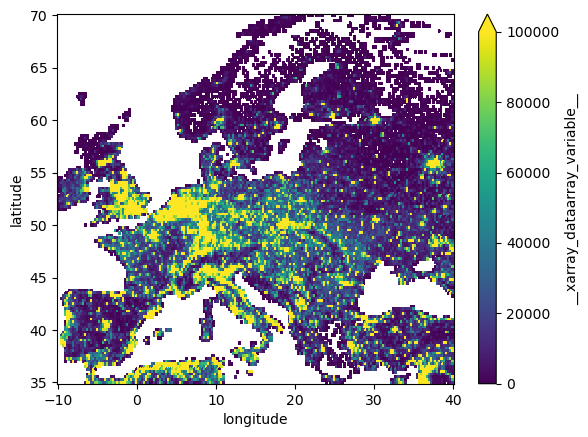

In [88]:
population_2020p.sel(latitude=slice(70, 35), longitude=slice(-10, 40)).plot(vmin = 0, vmax = 100000)

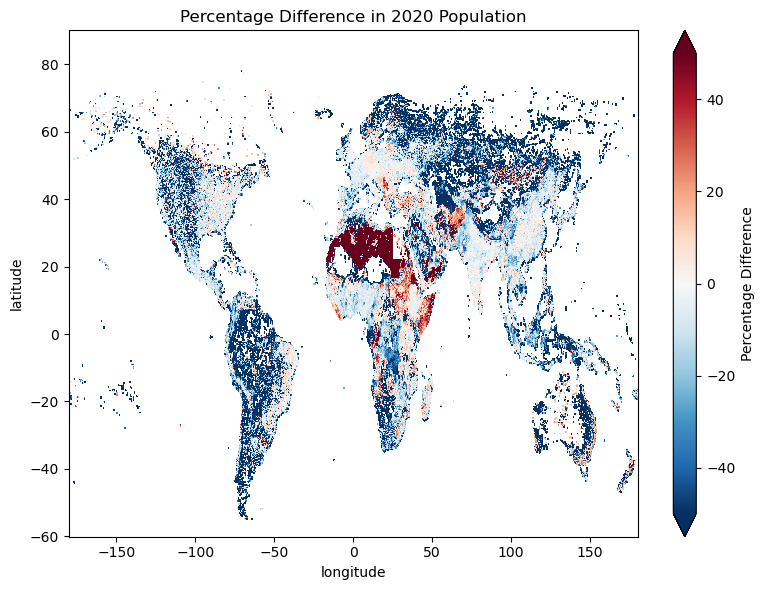


Percentage Difference Statistics:
nan
nan
Maximum Percentage Difference: nan%
Minimum Percentage Difference: nan%


In [48]:
percentage_difference = ((population_2020p - worldpop_2020_extended) / ((population_2020p + worldpop_2020_extended) / 2)) * 100

plt.figure(figsize=(8, 6))
percentage_difference.plot(cmap='RdBu_r', vmin=-50, vmax=50, cbar_kwargs={'label': 'Percentage Difference'})
plt.title('Percentage Difference in 2020 Population')
plt.tight_layout()
plt.show()

print("\nPercentage Difference Statistics:")
print(percentage_difference.values.mean())
print(percentage_difference.values.std())
print(f"Maximum Percentage Difference: {percentage_difference.values.max():.2f}%")
print(f"Minimum Percentage Difference: {percentage_difference.values.min():.2f}%")

In [32]:
rmse = np.sqrt(((worldpop_2020_extended - population_2020p)**2).mean())
print(f"\nRoot Mean Squared Error (RMSE): {rmse:.2f}")


Root Mean Squared Error (RMSE): 33752.02


In [33]:
correlation = xr.corr(worldpop_2020_extended, population_2020p)
print(f"Spatial Correlation: {correlation.item():.2f}")

Spatial Correlation: 0.99


# Person-days

## Calculate

In [22]:
person_days_ywi_2020 = ratio_y_2020p * population_2020p * pyhhb_ywi_blp
person_days_owi_2020 = ratio_o_2020p * population_2020p * pyhhb_owi_blp

person_days_ywi_2050 = ratio_y_2050p * population_2050p * pyhhb_ywi_2050p
person_days_owi_2050 = ratio_o_2050p * population_2050p * pyhhb_owi_2050p

In [23]:
person_days_total_2020 = person_days_ywi_2020 + person_days_owi_2020
person_days_total_2050 = person_days_ywi_2050 + person_days_owi_2050

In [24]:
person_days_total_diff = person_days_total_2050 - person_days_total_2020

## Plot

## Person-days

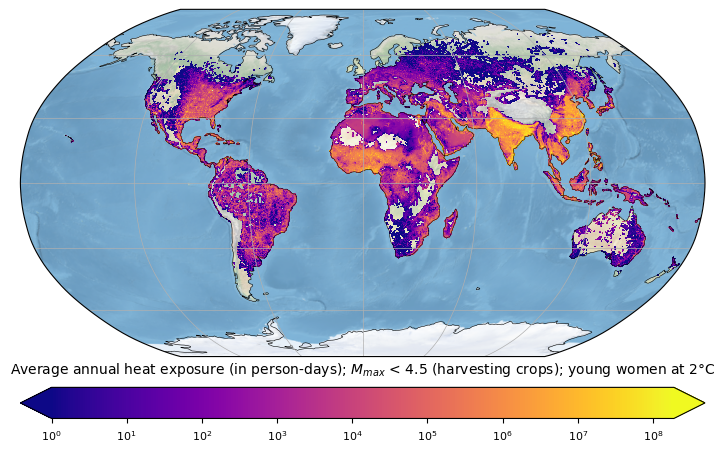

In [39]:
plot_world_person_days(person_days_ywi_2050, 'young women', '4.5', 'harvesting crops', world = '2C')

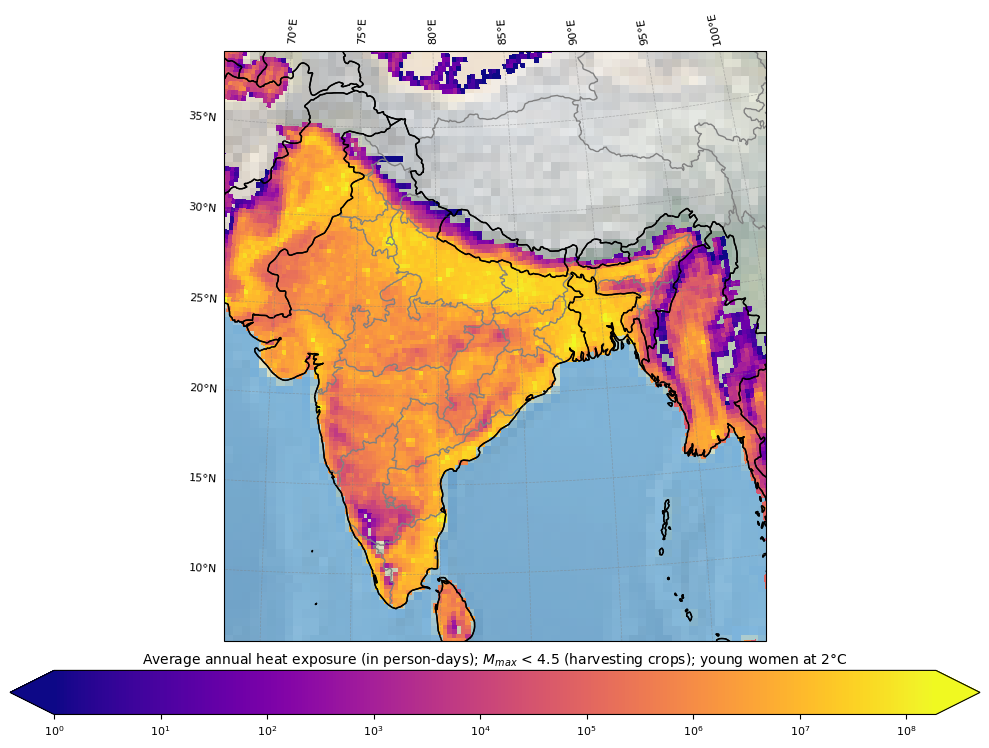

In [40]:
plot_india_person_days(person_days_ywi_2050, 'young women', '4.5', 'harvesting crops', world = '2C')

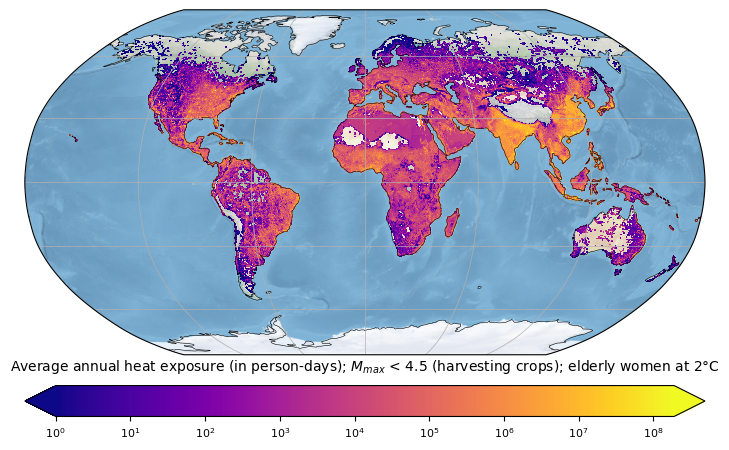

In [41]:
plot_world_person_days(person_days_owi_2050, 'elderly women', '4.5', 'harvesting crops', world = '2C')

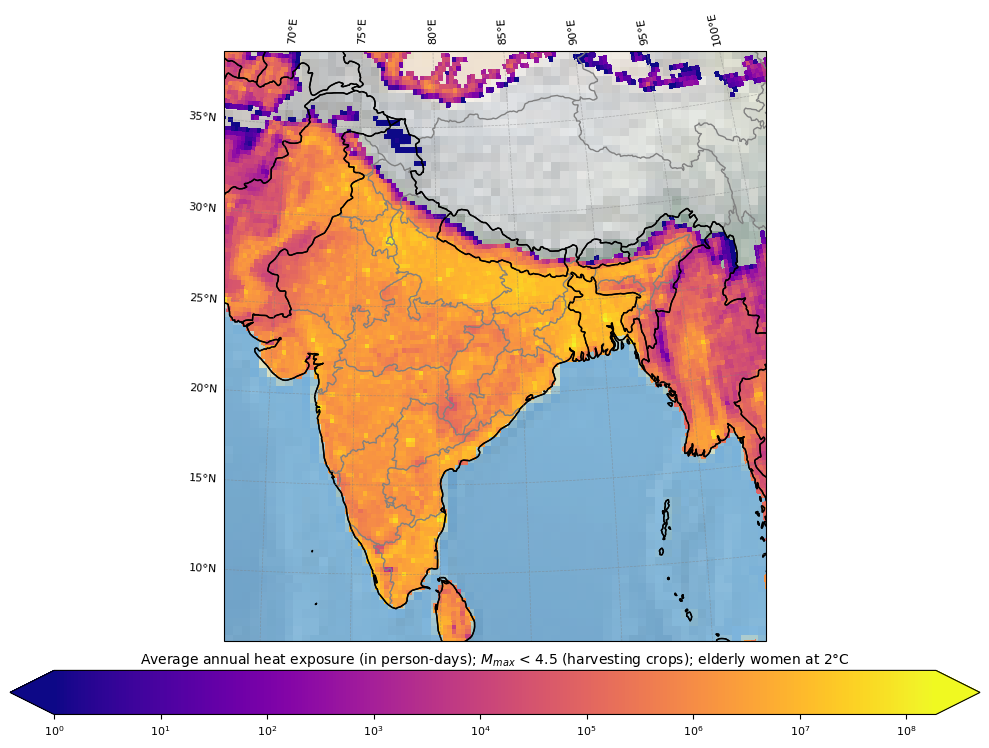

In [42]:
plot_india_person_days(person_days_owi_2050, 'elderly women', '4.5', 'harvesting crops', world = '2C')

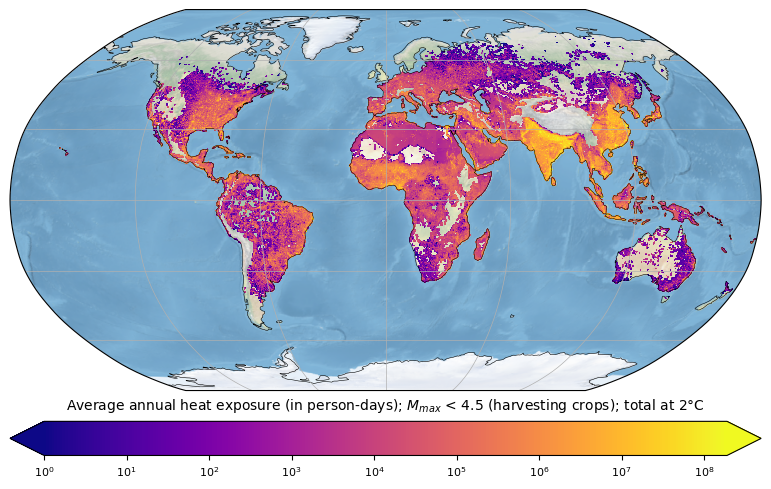

CPU times: total: 26.9 s
Wall time: 27.2 s


In [43]:
%%time

plot_world_person_days(person_days_total_2050, 'total', '4.5', 'harvesting crops', world = '2C')

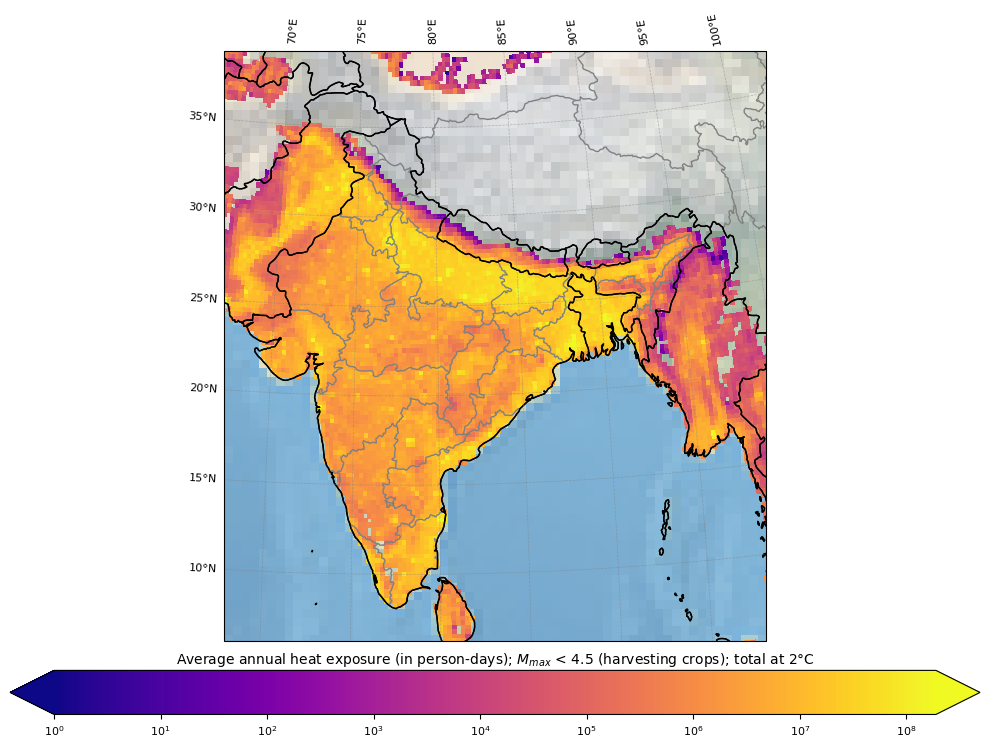

In [44]:
plot_india_person_days(person_days_total_2050, 'total', '4.5', 'harvesting crops', world = '2C')

## Person-days diff

C:\Users\haley\AppData\Local\Temp\ipykernel_27196\2870777000.py:30: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  norm = colors.SymLogNorm(linthresh=1, linscale=1, vmin=-max_abs_value, vmax=max_abs_value)


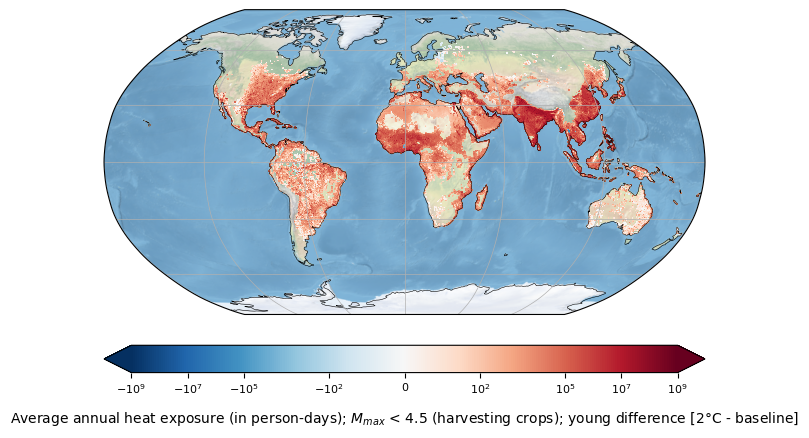

In [45]:
mmax = person_days_ywi_2050 - person_days_ywi_2020

plot_world_person_days_diff(mmax, 'young', '4.5', 'harvesting crops')

C:\Users\haley\AppData\Local\Temp\ipykernel_27196\3828969144.py:45: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  norm = colors.SymLogNorm(linthresh=1, linscale=1, vmin=-max_abs_value, vmax=max_abs_value)


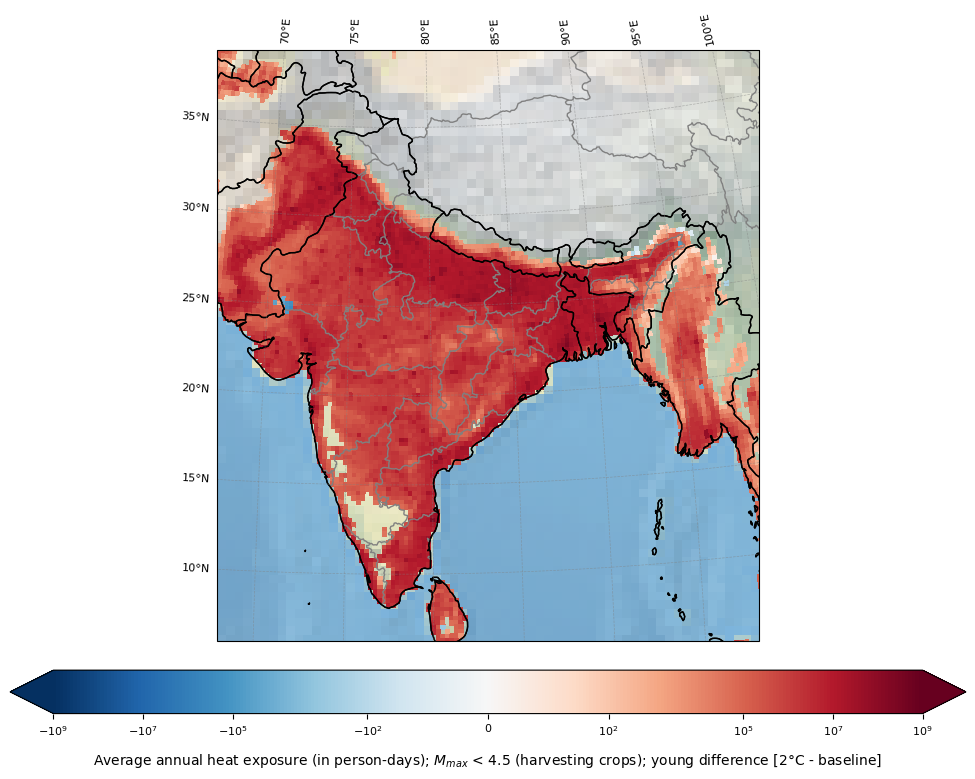

In [46]:
plot_india_person_days_diff(mmax, 'young', '4.5', 'harvesting crops')

C:\Users\haley\AppData\Local\Temp\ipykernel_27196\2870777000.py:30: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  norm = colors.SymLogNorm(linthresh=1, linscale=1, vmin=-max_abs_value, vmax=max_abs_value)


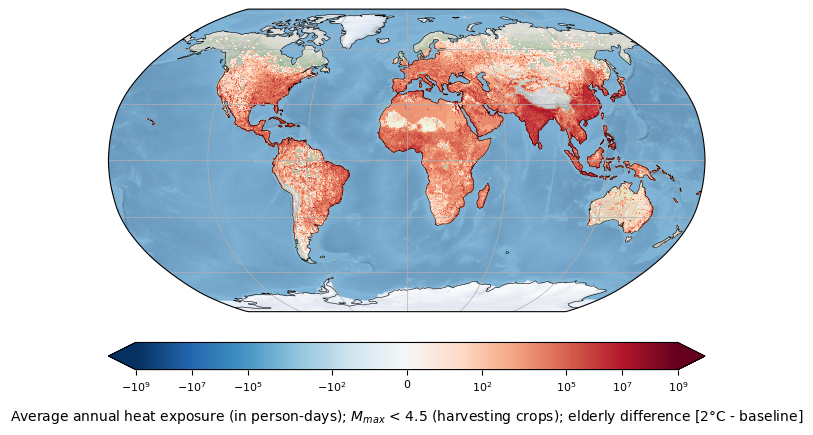

In [47]:
mmax = person_days_owi_2050 - person_days_owi_2020

plot_world_person_days_diff(mmax, 'elderly', '4.5', 'harvesting crops')

C:\Users\haley\AppData\Local\Temp\ipykernel_27196\3828969144.py:45: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  norm = colors.SymLogNorm(linthresh=1, linscale=1, vmin=-max_abs_value, vmax=max_abs_value)


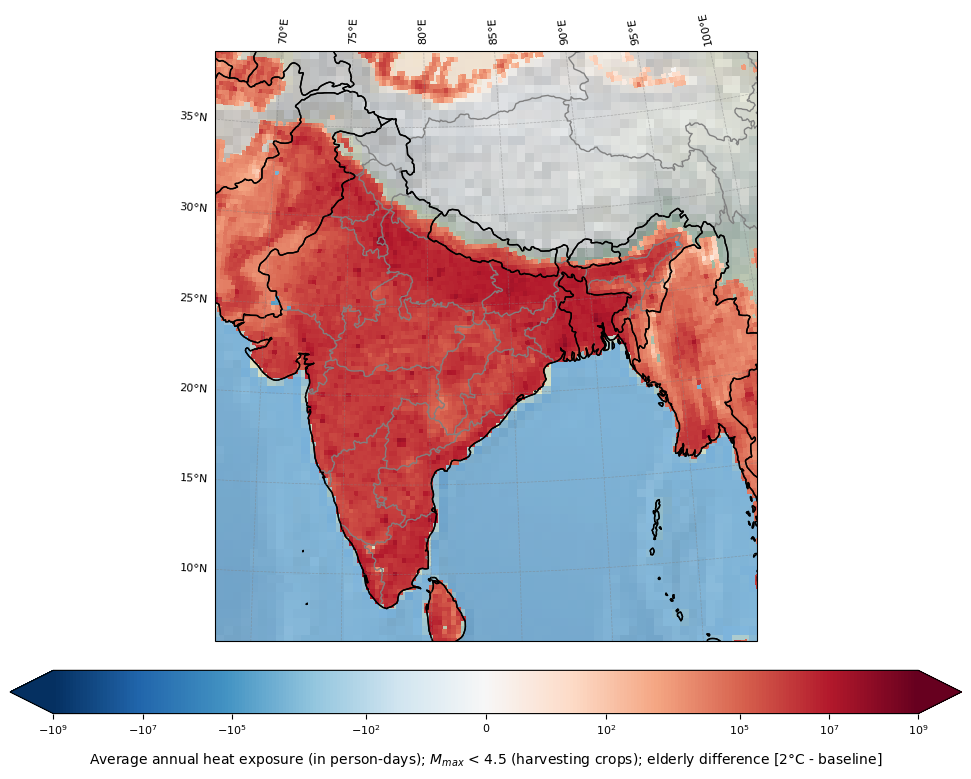

In [48]:
plot_india_person_days_diff(mmax, 'elderly', '4.5', 'harvesting crops')

C:\Users\haley\AppData\Local\Temp\ipykernel_27196\2870777000.py:30: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  norm = colors.SymLogNorm(linthresh=1, linscale=1, vmin=-max_abs_value, vmax=max_abs_value)


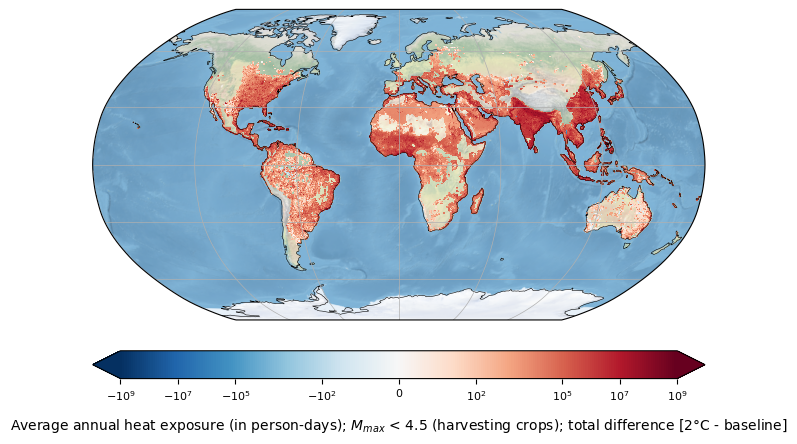

In [49]:
mmax = person_days_total_2050 - person_days_total_2020

plot_world_person_days_diff(mmax, 'total', '4.5', 'harvesting crops')

C:\Users\haley\AppData\Local\Temp\ipykernel_27196\3828969144.py:45: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  norm = colors.SymLogNorm(linthresh=1, linscale=1, vmin=-max_abs_value, vmax=max_abs_value)


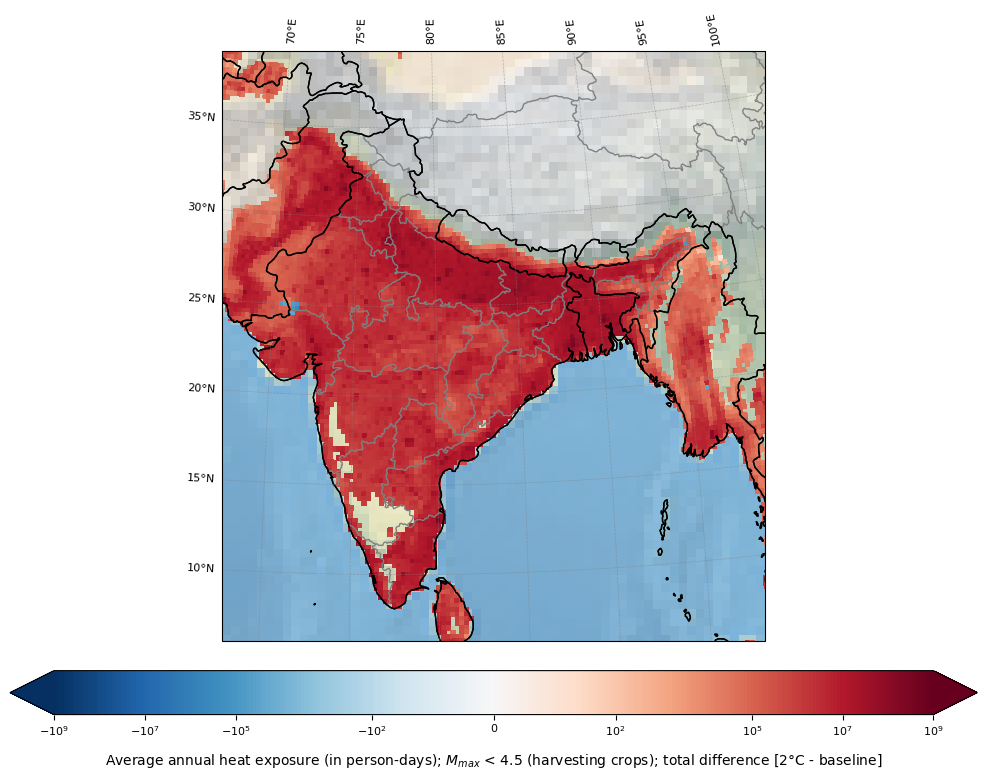

In [50]:
plot_india_person_days_diff(mmax, 'total', '4.5', 'harvesting crops')

# Comparing drivers

In [51]:
no_aging = (ratio_o_2020p * population_2050p * pyhhb_owi_2050p) + \
           (ratio_y_2020p * population_2050p * pyhhb_ywi_2050p)
no_pop_growth = (ratio_o_2050p * population_2020p * pyhhb_owi_2050p) + \
                (ratio_y_2050p * population_2020p * pyhhb_ywi_2050p)
no_cc = (ratio_o_2050p * population_2050p * pyhhb_owi_blp) + (ratio_y_2050p * population_2050p * pyhhb_ywi_blp)
allin = person_days_total_2050

In [52]:
no_aging_owi = (ratio_o_2020p * population_2050p * pyhhb_owi_2050p)
no_pop_growth_owi = (ratio_o_2050p * population_2020p * pyhhb_owi_2050p)
no_cc_owi = (ratio_o_2050p * population_2050p * pyhhb_owi_blp)
allin_owi = person_days_owi_2050

In [53]:
no_aging_ywi = (ratio_y_2020p * population_2050p * pyhhb_ywi_2050p)
no_pop_growth_ywi = (ratio_y_2050p * population_2020p * pyhhb_ywi_2050p)
no_cc_ywi = (ratio_y_2050p * population_2050p * pyhhb_ywi_blp)
allin_ywi = person_days_ywi_2050

In [56]:
effect_of_aging = allin - no_aging
effect_of_pop_growth = allin - no_pop_growth
effect_of_cc = allin - no_cc

In [57]:
diff_1 = effect_of_cc - effect_of_pop_growth - effect_of_aging

In [ ]:
# (allin - baseline) ?= (allin - no_aging) + (allin - no_pop_growth) + (allin - no_cc)

left_side = person_days_total_2050 - person_days_total_2020
right_side = (allin - no_aging) + (allin - no_pop_growth) + (allin - no_cc)

In [58]:
diff_2 = right_side - left_side

# Plot

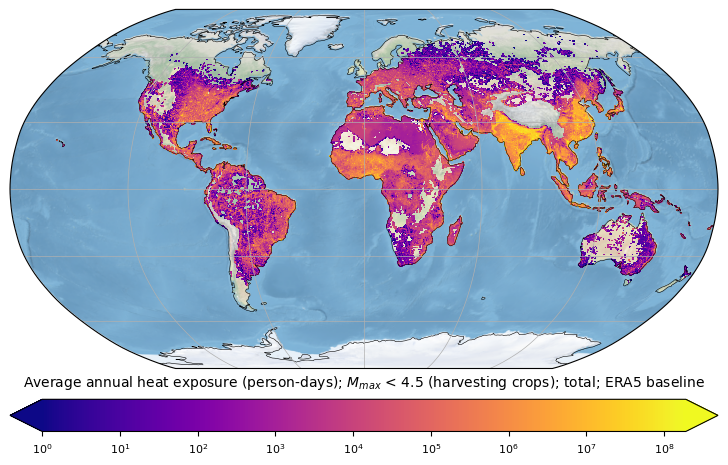

In [59]:
plot_world_person_days(no_aging, 'total', '4.5', 'harvesting crops', world = 'baseline')

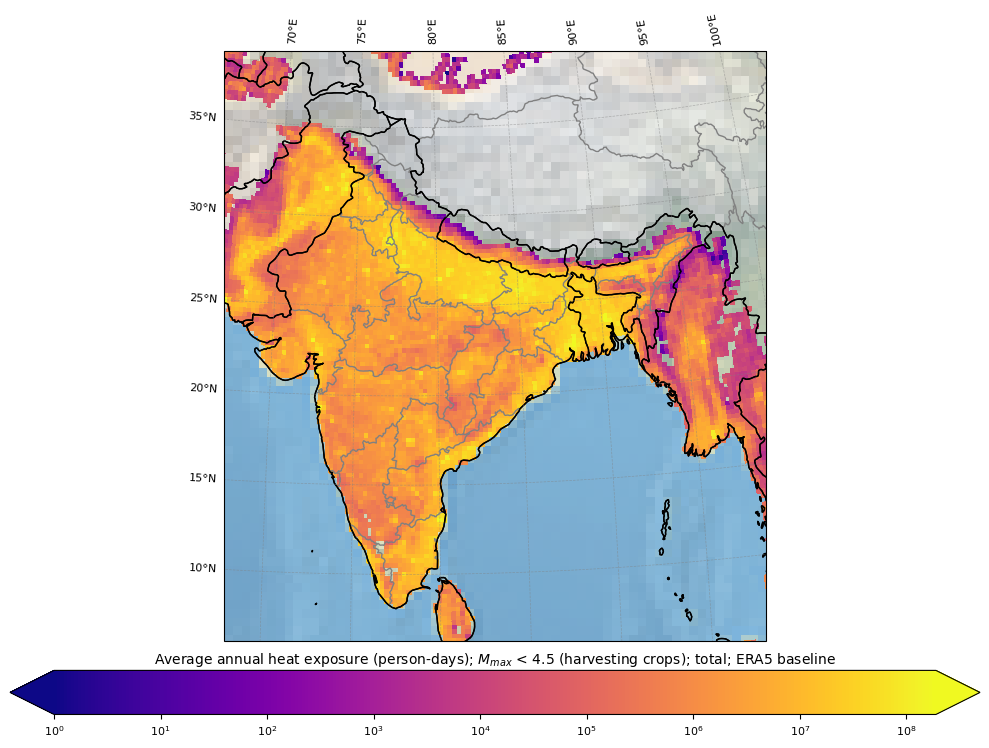

In [60]:
plot_india_person_days(no_aging, 'total', '4.5', 'harvesting crops', world = 'baseline')

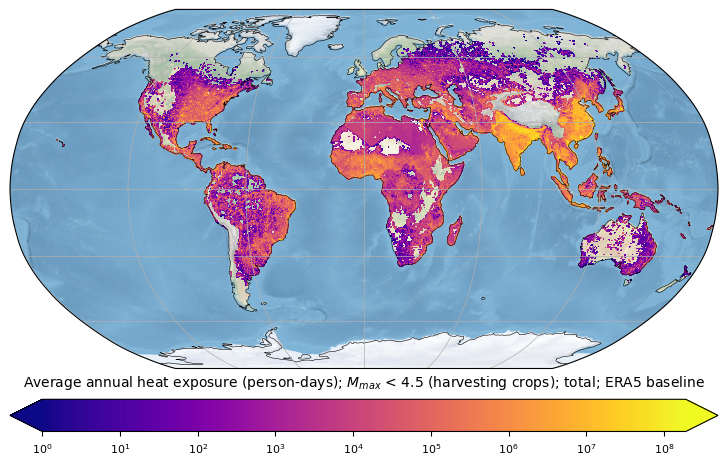

In [61]:
plot_world_person_days(no_pop_growth, 'total', '4.5', 'harvesting crops', world = 'baseline')

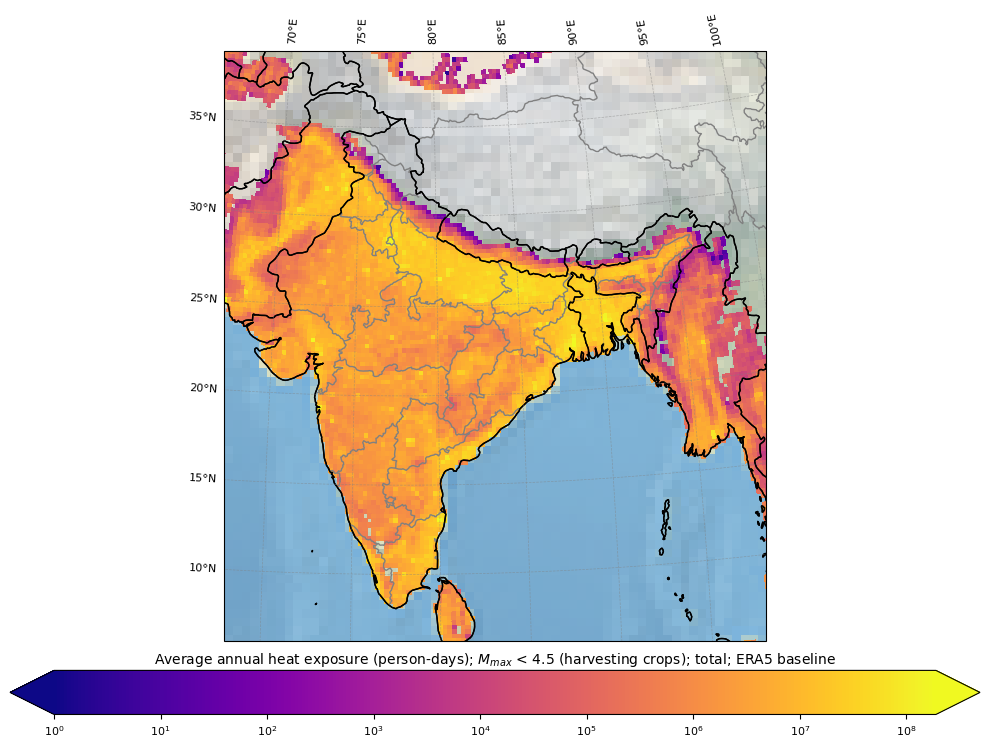

In [62]:
plot_india_person_days(no_pop_growth, 'total', '4.5', 'harvesting crops', world = 'baseline')

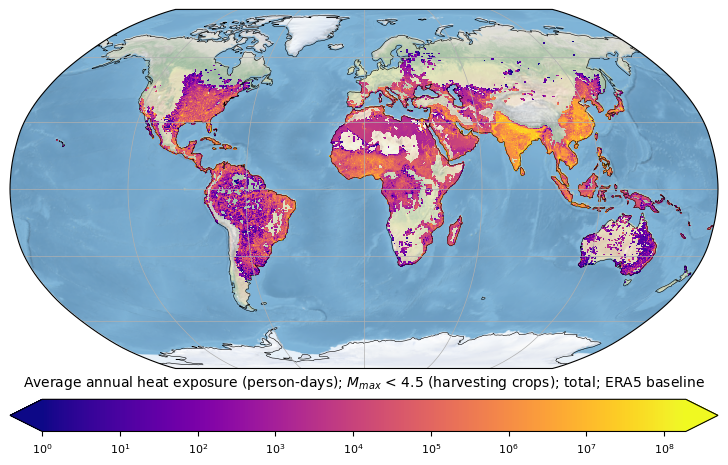

In [63]:
plot_world_person_days(no_cc, 'total', '4.5', 'harvesting crops', world = 'baseline')

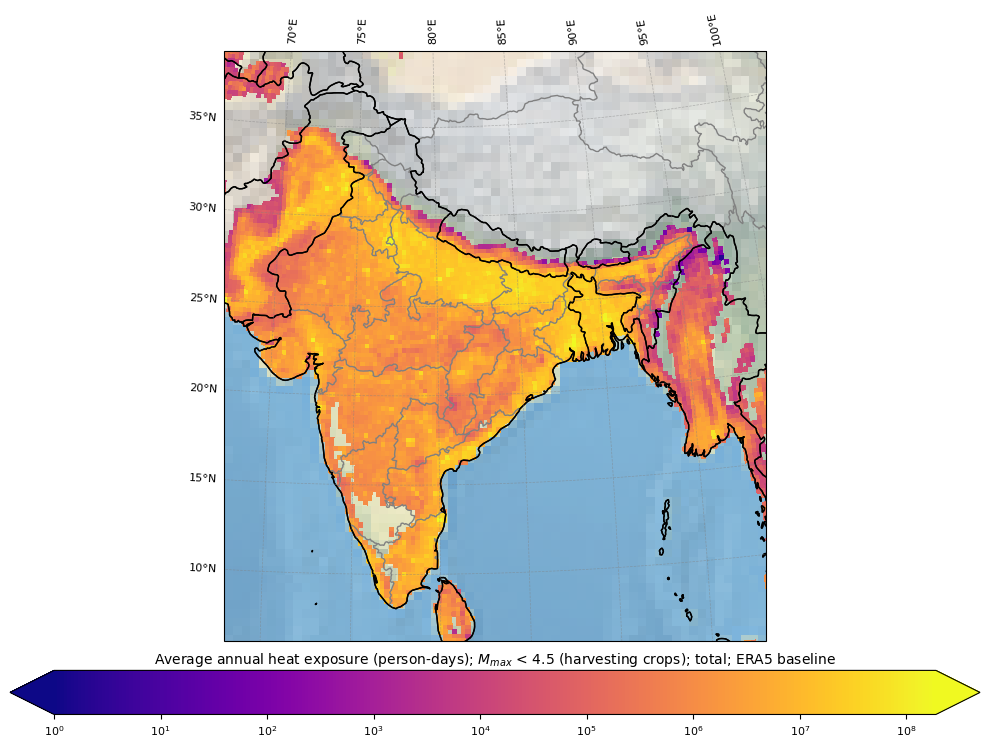

In [64]:
plot_india_person_days(no_cc, 'total', '4.5', 'harvesting crops', world = 'baseline')

## diff plots

C:\Users\haley\AppData\Local\Temp\ipykernel_27196\2870777000.py:30: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  norm = colors.SymLogNorm(linthresh=1, linscale=1, vmin=-max_abs_value, vmax=max_abs_value)


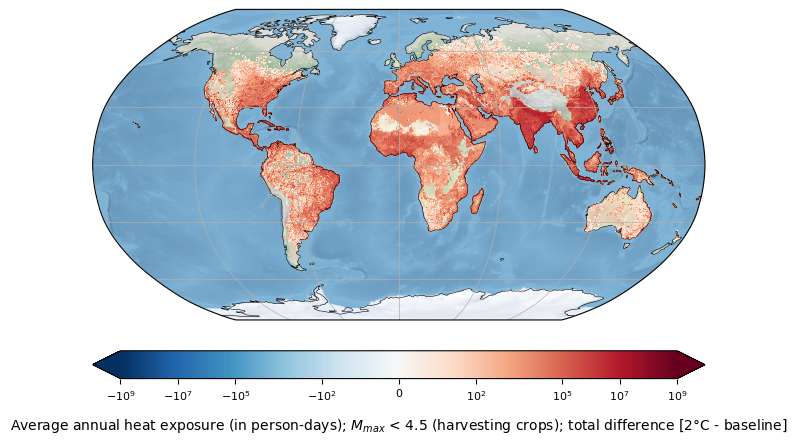

In [65]:
plot_world_person_days_diff(effect_of_aging, 'total', '4.5', 'harvesting crops')

C:\Users\haley\AppData\Local\Temp\ipykernel_27196\3828969144.py:45: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  norm = colors.SymLogNorm(linthresh=1, linscale=1, vmin=-max_abs_value, vmax=max_abs_value)


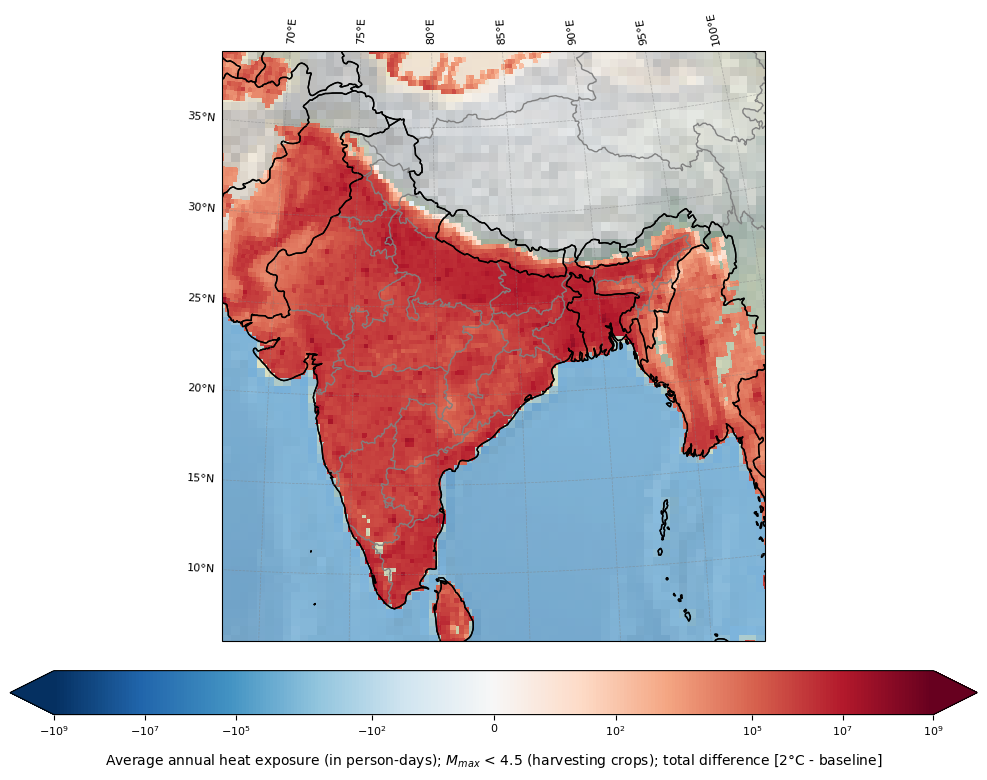

In [66]:
plot_india_person_days_diff(effect_of_aging, 'total', '4.5', 'harvesting crops')

C:\Users\haley\AppData\Local\Temp\ipykernel_27196\2870777000.py:30: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  norm = colors.SymLogNorm(linthresh=1, linscale=1, vmin=-max_abs_value, vmax=max_abs_value)


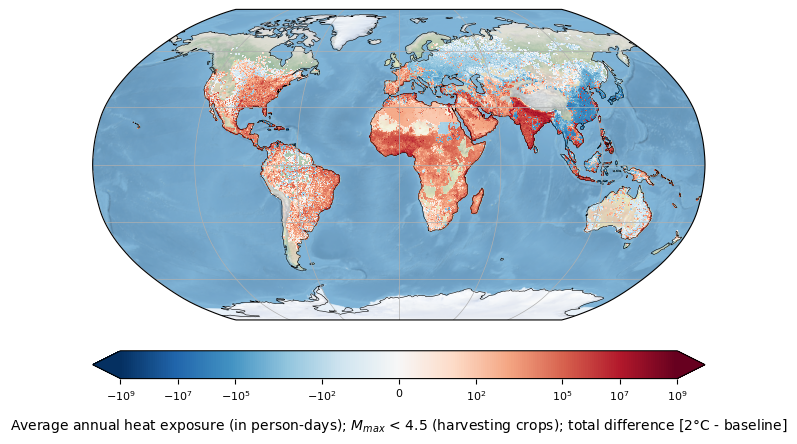

In [67]:
plot_world_person_days_diff(effect_of_pop_growth, 'total', '4.5', 'harvesting crops')

C:\Users\haley\AppData\Local\Temp\ipykernel_27196\3828969144.py:45: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  norm = colors.SymLogNorm(linthresh=1, linscale=1, vmin=-max_abs_value, vmax=max_abs_value)


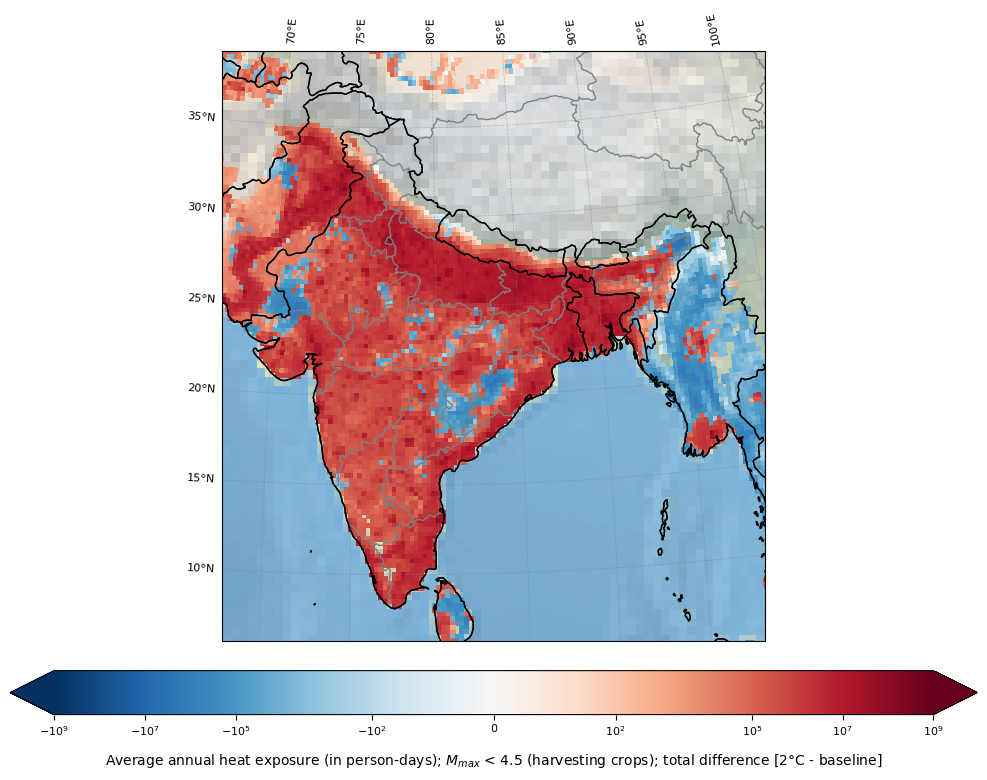

In [68]:
plot_india_person_days_diff(effect_of_pop_growth, 'total', '4.5', 'harvesting crops')

C:\Users\haley\AppData\Local\Temp\ipykernel_27196\2870777000.py:30: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  norm = colors.SymLogNorm(linthresh=1, linscale=1, vmin=-max_abs_value, vmax=max_abs_value)


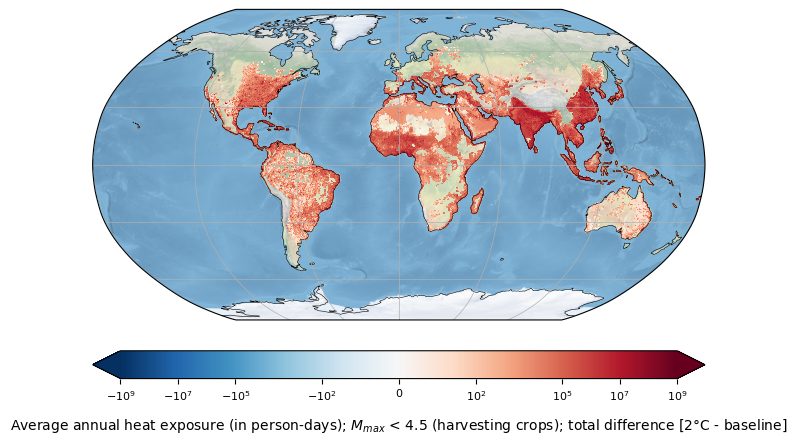

In [69]:
plot_world_person_days_diff(effect_of_cc, 'total', '4.5', 'harvesting crops')

C:\Users\haley\AppData\Local\Temp\ipykernel_27196\3828969144.py:45: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  norm = colors.SymLogNorm(linthresh=1, linscale=1, vmin=-max_abs_value, vmax=max_abs_value)


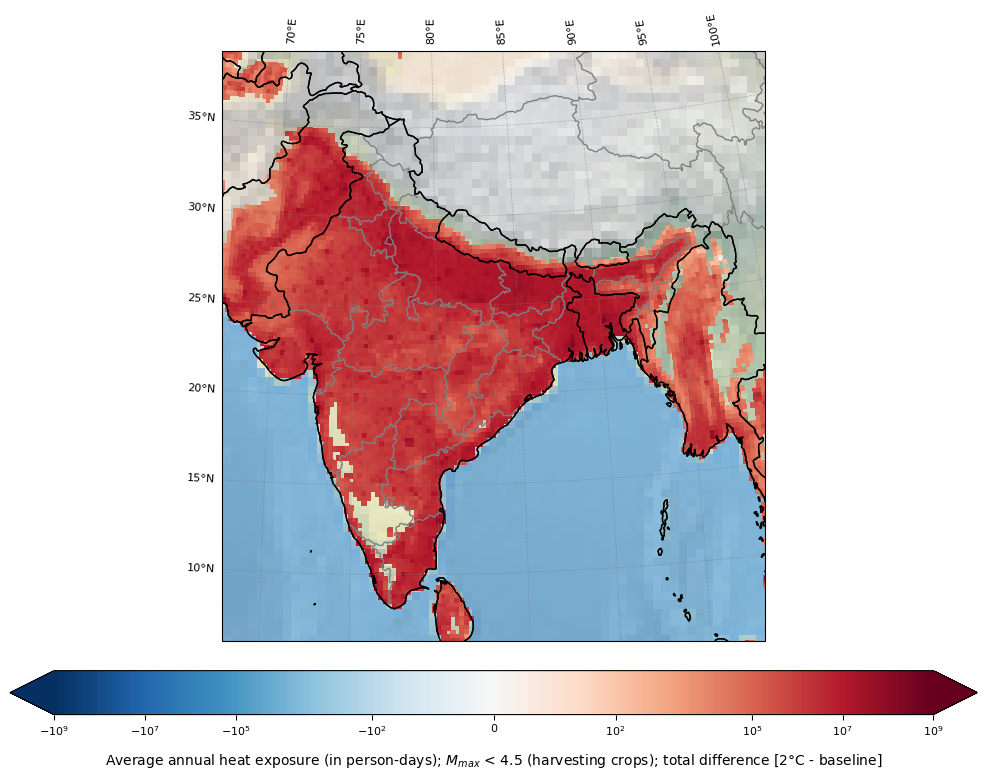

In [70]:
plot_india_person_days_diff(effect_of_cc, 'total', '4.5', 'harvesting crops')

C:\Users\haley\AppData\Local\Temp\ipykernel_27196\2870777000.py:30: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  norm = colors.SymLogNorm(linthresh=1, linscale=1, vmin=-max_abs_value, vmax=max_abs_value)


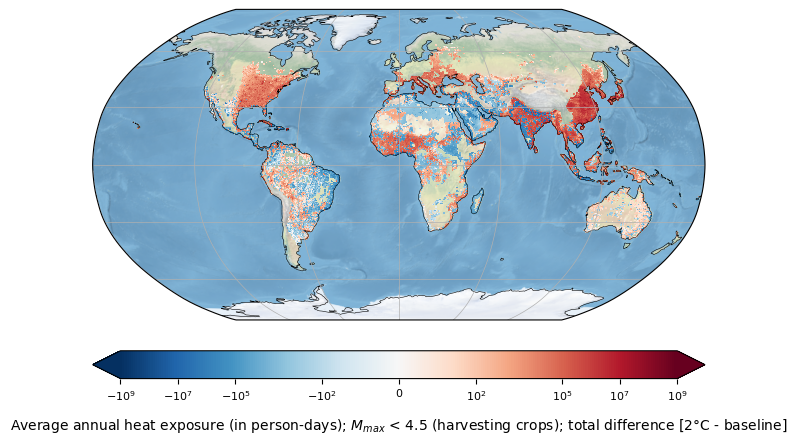

In [71]:
plot_world_person_days_diff(diff_1, 'total', '4.5', 'harvesting crops')

C:\Users\haley\AppData\Local\Temp\ipykernel_27196\3828969144.py:45: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  norm = colors.SymLogNorm(linthresh=1, linscale=1, vmin=-max_abs_value, vmax=max_abs_value)


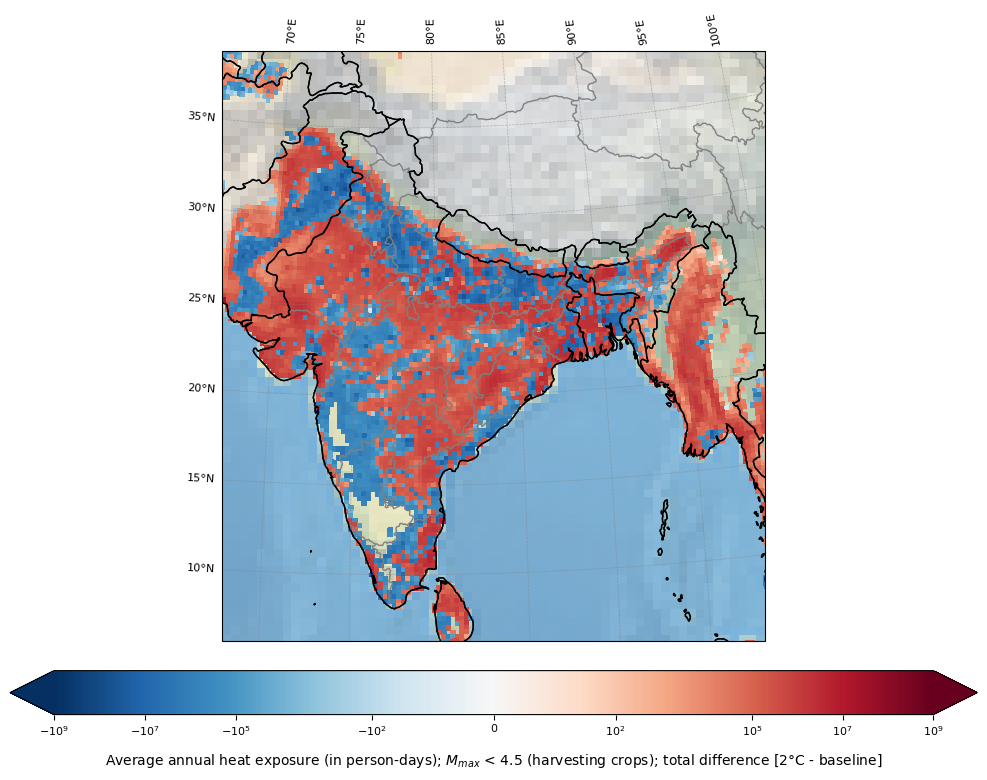

In [72]:
plot_india_person_days_diff(diff_1, 'total', '4.5', 'harvesting crops')

# Old

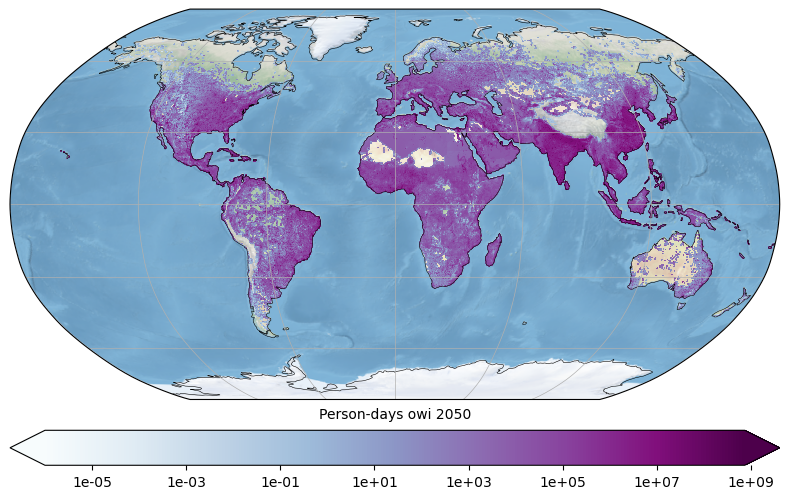

CPU times: total: 22.7 s
Wall time: 22.8 s


In [50]:
%%time

phys = 'owi'
year = '2050'
person_days = person_days_owi_2050

ult_min = 0.000001
ult_max = 737182390.285678

ssp = str(245)

lat_min = -90
lat_max = 90
lon_min = -180
lon_max = 180

latitudes = person_days.coords['latitude'].sel(latitude = slice(lat_max, lat_min)).values 
longitudes = person_days.coords['longitude'].sel(longitude = slice(lon_min, lon_max)).values

title_colorbar = 'Person-days ' + phys + ' ' + year
fig = plt.figure(figsize = (8, 8))
ax = fig.add_subplot(1, 1, 1, projection = ccrs.Robinson())
ax.stock_img()
ax.coastlines(lw = 0.4)

# Extract the numpy array from the xarray DataArray
person_days_values = person_days.values

# Mask out non-positive values
person_days_masked = np.ma.masked_less_equal(person_days_values, 0)

# Define logarithmic levels
min_value = np.nanmin(person_days_masked[~person_days_masked.mask])  # Minimum non-zero value
max_value = np.nanmax(person_days_masked)
levels = np.logspace(np.log10(ult_min), np.log10(ult_max), num = 20)

cmap = plt.get_cmap('BuPu')
norm = colors.LogNorm(vmin = ult_min, vmax = ult_max)

filled_c = ax.pcolormesh(longitudes, latitudes, person_days_masked,
                         transform = ccrs.PlateCarree(),
                         cmap = 'BuPu', norm = norm)

# Create tick locations for the colorbar
tick_locations = np.logspace(np.log10(ult_min), np.log10(ult_max), num = 5)

clb = plt.colorbar(filled_c, orientation = 'horizontal', extend = 'both', pad = 0.04,
                   ticks = tick_locations)

clb.set_label(title_colorbar, fontsize = 10, labelpad = -59)
clb.ax.set_xscale('log')

# Format the tick labels to use scientific notation
clb.ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x:.0e}'))

gl = ax.gridlines(draw_labels = False, linewidth = 0.5)
gl.top_labels = False
gl.left_labels = False

fig.tight_layout()

plt.show()
plt.close()

In [51]:
%%time

phys = 'owi'
year = '2050 - 2020 difference'


CPU times: total: 0 ns
Wall time: 0 ns


<timed exec>:23: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.


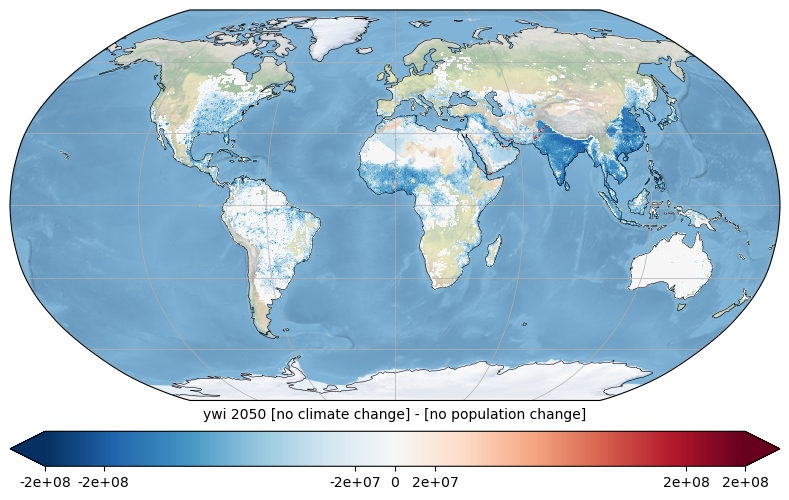

CPU times: total: 21.9 s
Wall time: 22.2 s


In [52]:
%%time

phys = 'ywi'
person_days = person_days_ywi_2050_no_cc - person_days_ywi_2050_no_pc

lat_min = -90
lat_max = 90
lon_min = -180
lon_max = 180

latitudes = person_days.coords['latitude'].sel(latitude=slice(lat_max, lat_min)).values 
longitudes = person_days.coords['longitude'].sel(longitude=slice(lon_min, lon_max)).values

title_colorbar = phys + ' 2050 [no climate change] - [no population change]'
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.Robinson())
ax.stock_img()
ax.coastlines(lw=0.4)

# Determine the maximum absolute value for symmetric scaling
vmax = max(abs(person_days.min()), abs(person_days.max()))

# Define SymLogNorm
linthresh = 1000  # Adjust this value to change the linear range around zero
norm = SymLogNorm(linthresh=linthresh, vmin=-vmax, vmax=vmax)

# Create a diverging colormap
cmap = plt.get_cmap('RdBu_r')

filled_c = ax.pcolormesh(longitudes, latitudes, person_days.values,
                         transform=ccrs.PlateCarree(),
                         cmap=cmap, norm=norm)

# Create tick locations for the colorbar
tick_locations = [-vmax, -vmax/10, -linthresh, 0, linthresh, vmax/10, vmax]

clb = plt.colorbar(filled_c, orientation='horizontal', extend='both', pad=0.04,
                   ticks=tick_locations)

clb.set_label(title_colorbar, fontsize=10, labelpad=-59)

# Format the tick labels to use scientific notation
clb.ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x:.0e}' if x != 0 else '0'))

gl = ax.gridlines(draw_labels=False, linewidth=0.5)
gl.top_labels = False
gl.left_labels = False

fig.tight_layout()

plt.show()
plt.close()

<timed exec>:23: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.


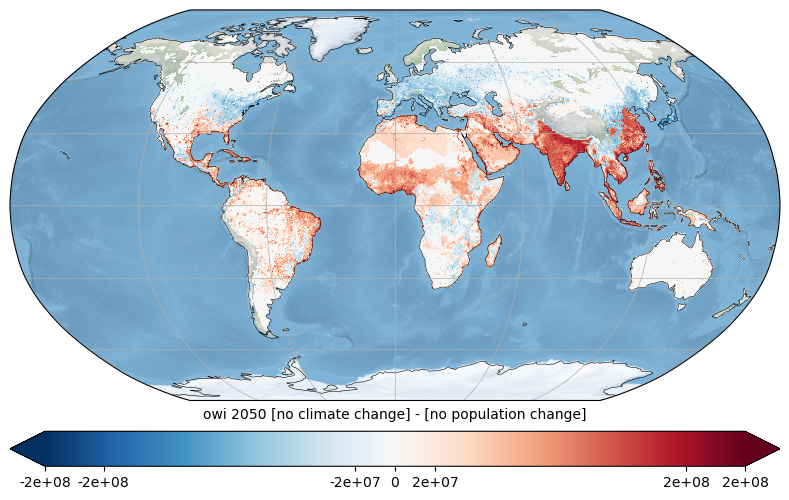

CPU times: total: 19.5 s
Wall time: 19.6 s


In [53]:
%%time

phys = 'owi'
person_days = person_days_owi_2050_no_cc - person_days_owi_2050_no_pc

lat_min = -90
lat_max = 90
lon_min = -180
lon_max = 180

latitudes = person_days.coords['latitude'].sel(latitude=slice(lat_max, lat_min)).values 
longitudes = person_days.coords['longitude'].sel(longitude=slice(lon_min, lon_max)).values

title_colorbar = phys + ' 2050 [no climate change] - [no population change]'
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.Robinson())
ax.stock_img()
ax.coastlines(lw=0.4)

# Determine the maximum absolute value for symmetric scaling
# vmax = max(abs(person_days.min()), abs(person_days.max()))

# Define SymLogNorm
linthresh = 1000  # Adjust this value to change the linear range around zero
norm = SymLogNorm(linthresh=linthresh, vmin=-vmax, vmax=vmax)

# Create a diverging colormap
cmap = plt.get_cmap('RdBu_r')

filled_c = ax.pcolormesh(longitudes, latitudes, person_days.values,
                         transform=ccrs.PlateCarree(),
                         cmap=cmap, norm=norm)

# Create tick locations for the colorbar
tick_locations = [-vmax, -vmax/10, -linthresh, 0, linthresh, vmax/10, vmax]

clb = plt.colorbar(filled_c, orientation='horizontal', extend='both', pad=0.04,
                   ticks=tick_locations)

clb.set_label(title_colorbar, fontsize=10, labelpad=-59)

# Format the tick labels to use scientific notation
clb.ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x:.0e}' if x != 0 else '0'))

gl = ax.gridlines(draw_labels=False, linewidth=0.5)
gl.top_labels = False
gl.left_labels = False

fig.tight_layout()

plt.show()
plt.close()

<timed exec>:23: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.


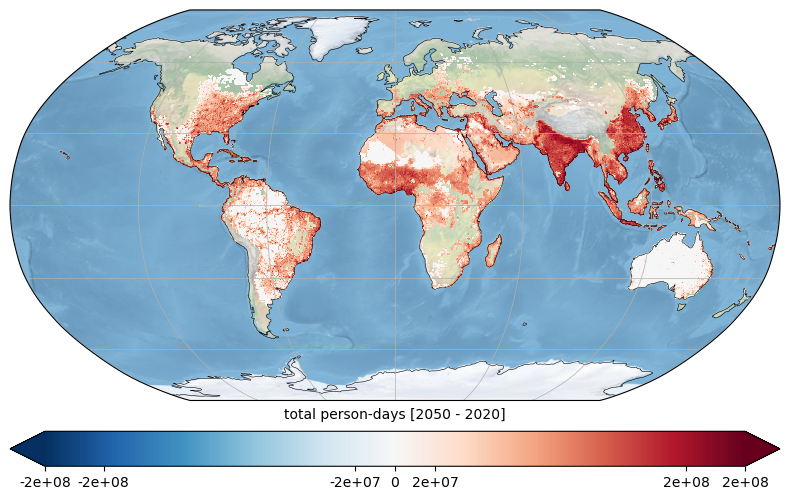

CPU times: total: 22.3 s
Wall time: 22.6 s


In [54]:
%%time

phys = 'total person-days'
person_days = person_days_total_2050 - person_days_total_2020

lat_min = -90
lat_max = 90
lon_min = -180
lon_max = 180

latitudes = person_days.coords['latitude'].sel(latitude=slice(lat_max, lat_min)).values 
longitudes = person_days.coords['longitude'].sel(longitude=slice(lon_min, lon_max)).values

title_colorbar = phys + ' [2050 - 2020]'
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.Robinson())
ax.stock_img()
ax.coastlines(lw=0.4)

# Determine the maximum absolute value for symmetric scaling
# vmax = max(abs(person_days.min()), abs(person_days.max()))

# Define SymLogNorm
linthresh = 1000  # Adjust this value to change the linear range around zero
norm = SymLogNorm(linthresh=linthresh, vmin=-vmax, vmax=vmax)

# Create a diverging colormap
cmap = plt.get_cmap('RdBu_r')

filled_c = ax.pcolormesh(longitudes, latitudes, person_days.values,
                         transform=ccrs.PlateCarree(),
                         cmap=cmap, norm=norm)

# Create tick locations for the colorbar
tick_locations = [-vmax, -vmax/10, -linthresh, 0, linthresh, vmax/10, vmax]

clb = plt.colorbar(filled_c, orientation='horizontal', extend='both', pad=0.04,
                   ticks=tick_locations)

clb.set_label(title_colorbar, fontsize=10, labelpad=-59)

# Format the tick labels to use scientific notation
clb.ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x:.0e}' if x != 0 else '0'))

gl = ax.gridlines(draw_labels=False, linewidth=0.5)
gl.top_labels = False
gl.left_labels = False

fig.tight_layout()

plt.show()
plt.close()

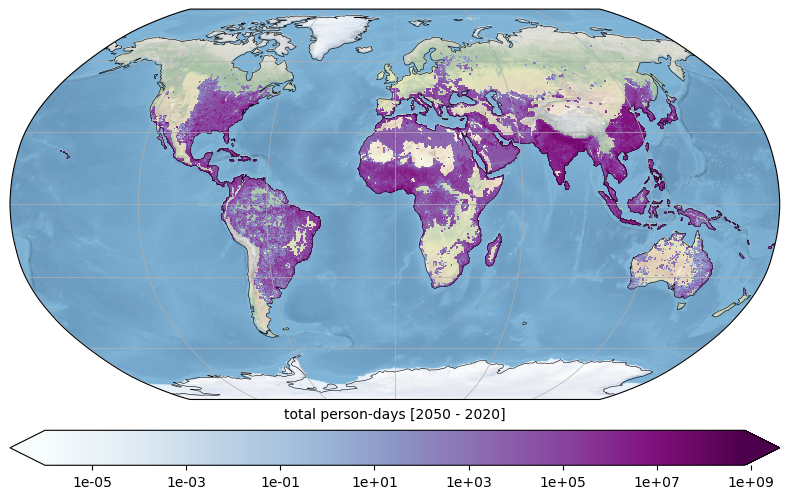

CPU times: total: 20 s
Wall time: 20.1 s


In [55]:
%%time

phys = 'total person-days'
person_days = person_days_total_2050 - person_days_total_2020

ult_min = 0.000001
ult_max = 737182390.285678

ssp = str(245)

lat_min = -90
lat_max = 90
lon_min = -180
lon_max = 180

latitudes = person_days.coords['latitude'].sel(latitude = slice(lat_max, lat_min)).values 
longitudes = person_days.coords['longitude'].sel(longitude = slice(lon_min, lon_max)).values

title_colorbar = phys + ' [2050 - 2020]'
fig = plt.figure(figsize = (8, 8))
ax = fig.add_subplot(1, 1, 1, projection = ccrs.Robinson())
ax.stock_img()
ax.coastlines(lw = 0.4)

# Extract the numpy array from the xarray DataArray
person_days_values = person_days.values

# Mask out non-positive values
person_days_masked = np.ma.masked_less_equal(person_days_values, 0)

# Define logarithmic levels
min_value = np.nanmin(person_days_masked[~person_days_masked.mask])  # Minimum non-zero value
max_value = np.nanmax(person_days_masked)
levels = np.logspace(np.log10(ult_min), np.log10(ult_max), num = 20)

cmap = plt.get_cmap('BuPu')
norm = colors.LogNorm(vmin = ult_min, vmax = ult_max)

filled_c = ax.pcolormesh(longitudes, latitudes, person_days_masked,
                         transform = ccrs.PlateCarree(),
                         cmap = 'BuPu', norm = norm)

# Create tick locations for the colorbar
tick_locations = np.logspace(np.log10(ult_min), np.log10(ult_max), num = 5)

clb = plt.colorbar(filled_c, orientation = 'horizontal', extend = 'both', pad = 0.04,
                   ticks = tick_locations)

clb.set_label(title_colorbar, fontsize = 10, labelpad = -59)
clb.ax.set_xscale('log')

# Format the tick labels to use scientific notation
clb.ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x:.0e}'))

gl = ax.gridlines(draw_labels = False, linewidth = 0.5)
gl.top_labels = False
gl.left_labels = False

fig.tight_layout()

plt.show()
plt.close()